# Step A: Multi-Product Detection on Store Shelves

In this notebook, we will implement an object detection pipeline using ORB features and homography  
to recognize multiple cereal boxes in shelf images.

**Outline:**
1. Import dependencies  
2. Configure paths and ORB parameters  
3. Extract features and match  
4. Filter matches and estimate homography  
5. Compute bounding boxes (center, width, height)  
6. Visualize results

In [29]:
# 1. Import dependencies
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
# Enable inline plotting
%matplotlib inline


## 2. Configuration

- `REF_DIR`: Folder containing reference images (`models/`)  
- `SCENE_DIR`: Folder containing scene images (`scenes/`)  
- `MAX_FEATURES`: Maximum number of ORB keypoints to detect  
- `GOOD_MATCH_RATIO`: Lowe’s ratio threshold for good matches


In [30]:
# 2. Set paths and ORB parameters
REF_DIR = 'models'
SCENE_DIR = 'scenes'

# Only the 7 target models for Step A:
REF_FILES = [
    "0.jpg", "1.jpg", "11.jpg", "19.jpg",
    "24.jpg", "25.jpg", "26.jpg"
]

MAX_FEATURES   = 1000
GOOD_MATCH_RATIO = 0.75    # make ratio test more permissive
MIN_INLIERS      = 15      # minimum RANSAC inliers to trust a homography

# Initialize ORB detector + matcher
orb = cv2.ORB_create(nfeatures=MAX_FEATURES)
bf  = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=False)

## 3. Feature Extraction and Matching

Define two helper functions:
- `detect_and_compute(img)`: detect ORB keypoints & compute descriptors  
- `match_features(des1, des2, ratio)`: match descriptors via k‑NN and apply Lowe’s ratio test


In [31]:
# 3. Define feature extraction and matching functions

def detect_and_compute(img):
    """
    Detect ORB keypoints and compute descriptors.
    """
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    kp, des = orb.detectAndCompute(gray, None)
    return kp, des

def match_features(des1, des2, ratio=GOOD_MATCH_RATIO):
    """
    Match descriptors using k-NN and apply Lowe's ratio test.
    Returns a list of good matches.
    """
    matches = bf.knnMatch(des1, des2, k=2)
    good = []
    for m, n in matches:
        if m.distance < ratio * n.distance:
            good.append(m)
    return good


## 4. Homography Estimation & Bounding Box Calculation

Function `detect_instances` will:
1. Extract & match features between reference and scene  
2. Check for at least `min_matches` good matches  
3. Estimate homography via RANSAC  
4. Project reference corners into the scene  
5. Compute bounding‑box center, width, height


In [32]:
# 4. Define instance detection function with debug
def detect_instances(ref_img, scene_img, min_inliers=MIN_INLIERS):
    """
    Try to find exactly one instance of ref_img in scene_img.
    Returns (center, (w,h), corners, inliers) if inliers>=min_inliers, else None.
    """
    # extract features
    ref_kp, ref_des     = detect_and_compute(ref_img)
    scene_kp, scene_des = detect_and_compute(scene_img)

    # match + ratio test
    matches = bf.knnMatch(ref_des, scene_des, k=2)
    good    = [m for m,n in matches if m.distance < GOOD_MATCH_RATIO * n.distance]
    if len(good) < 8:         # quick pre‐filter  
        return None

    # homography
    src_pts = np.float32([ref_kp[m.queryIdx].pt for m in good]).reshape(-1,1,2)
    dst_pts = np.float32([scene_kp[m.trainIdx].pt for m in good]).reshape(-1,1,2)
    H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
    if H is None:
        return None

    inliers = int(mask.sum())
    if inliers < min_inliers:
        return None

    # project corners
    h_ref, w_ref = ref_img.shape[:2]
    corners0 = np.float32([[0,0],[w_ref,0],[w_ref,h_ref],[0,h_ref]]).reshape(-1,1,2)
    proj_c   = cv2.perspectiveTransform(corners0, H).reshape(-1,2)
    x_min, y_min = proj_c.min(axis=0)
    x_max, y_max = proj_c.max(axis=0)
    w_box, h_box = x_max-x_min, y_max-y_min
    center = (x_min + w_box/2, y_min + h_box/2)

    return center, (w_box, h_box), proj_c, inliers

    """
    Detect instances of ref_img within scene_img.
    Prints number of good matches for debugging.
    Returns a list of tuples: (center, (width, height), projected_corners).
    """
    # 1) Extract features
    ref_kp, ref_des = detect_and_compute(ref_img)
    scene_kp, scene_des = detect_and_compute(scene_img)
    
    # 2) Match and filter
    good = match_features(ref_des, scene_des)
    print(f"    Found {len(good)} good matches")  # debug
    
    # 3) Check threshold
    if len(good) < min_matches:
        return []
    
    # 4) Prepare points for homography
    src_pts = np.float32([ref_kp[m.queryIdx].pt for m in good]).reshape(-1,1,2)
    dst_pts = np.float32([scene_kp[m.trainIdx].pt for m in good]).reshape(-1,1,2)
    
    # 5) Estimate homography
    H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
    if H is None:
        return []
    
    # 6) Project corners and compute bbox
    h_ref, w_ref = ref_img.shape[:2]
    corners = np.float32([[0,0], [w_ref,0], [w_ref,h_ref], [0,h_ref]]).reshape(-1,1,2)
    proj_corners = cv2.perspectiveTransform(corners, H).reshape(-1,2)
    x_min, y_min = proj_corners.min(axis=0)
    x_max, y_max = proj_corners.max(axis=0)
    w_box, h_box = x_max - x_min, y_max - y_min
    center = (x_min + w_box/2, y_min + h_box/2)
    
    return [(center, (w_box, h_box), proj_corners)]


## 5. Execution & Visualization

Loop over all scenes, detect each reference, draw bounding boxes, and display both  
the annotated image and detection details in the console.


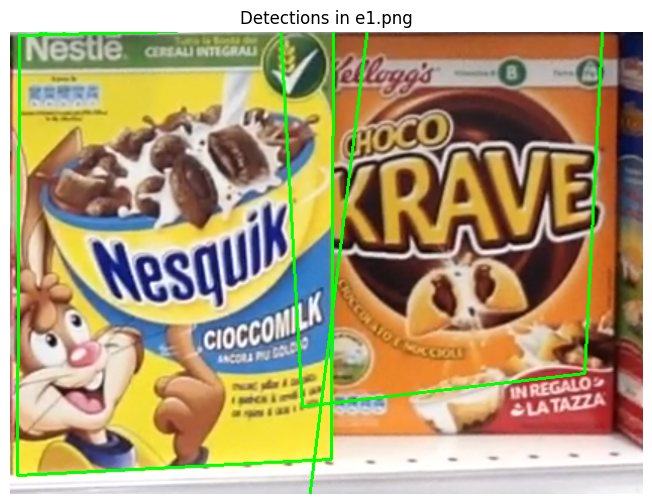

Product 0.jpg: inliers=20, center=(164.3,217.0), w=312.7px, h=445.6px
Product 11.jpg: inliers=31, center=(425.4,143.7), w=323.3px, h=455.5px
Product 26.jpg: inliers=38, center=(99.5,227.0), w=523.5px, h=640.8px


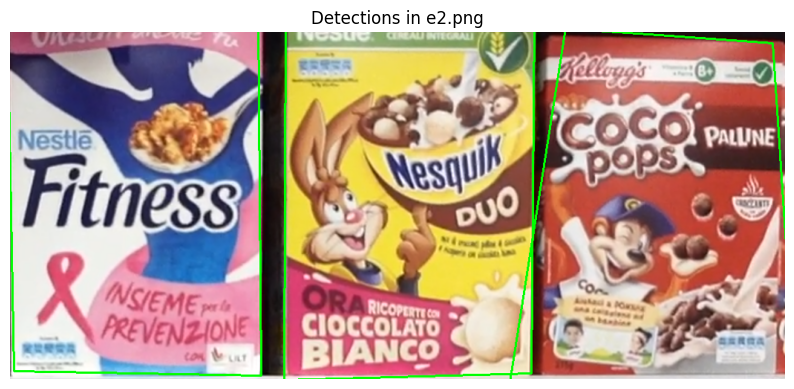

Product 24.jpg: inliers=115, center=(167.2,219.3), w=343.3px, h=489.0px
Product 25.jpg: inliers=47, center=(861.2,299.5), w=410.8px, h=608.6px
Product 26.jpg: inliers=100, center=(538.2,220.5), w=336.8px, h=497.3px


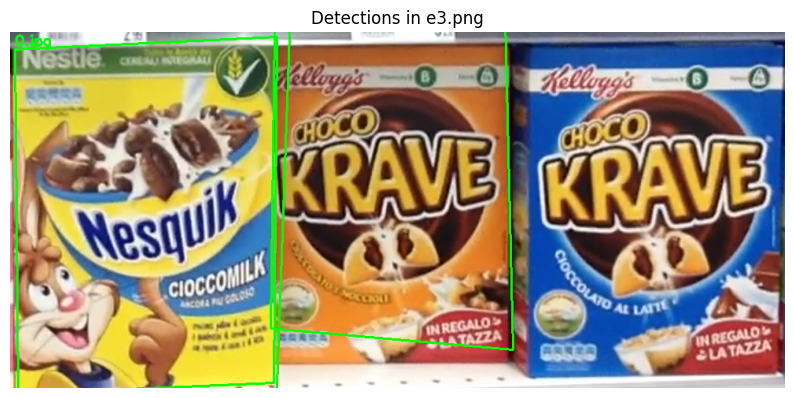

Product 0.jpg: inliers=17, center=(172.7,233.9), w=333.5px, h=453.4px
Product 11.jpg: inliers=15, center=(485.6,195.0), w=307.8px, h=419.3px
Product 26.jpg: inliers=36, center=(120.7,285.6), w=471.8px, h=617.8px


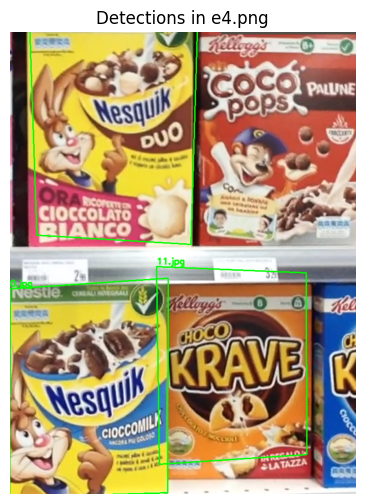

Product 0.jpg: inliers=17, center=(162.7,736.8), w=327.6px, h=454.0px
Product 11.jpg: inliers=21, center=(457.4,690.1), w=310.8px, h=408.7px
Product 26.jpg: inliers=39, center=(213.6,186.3), w=349.0px, h=506.2px


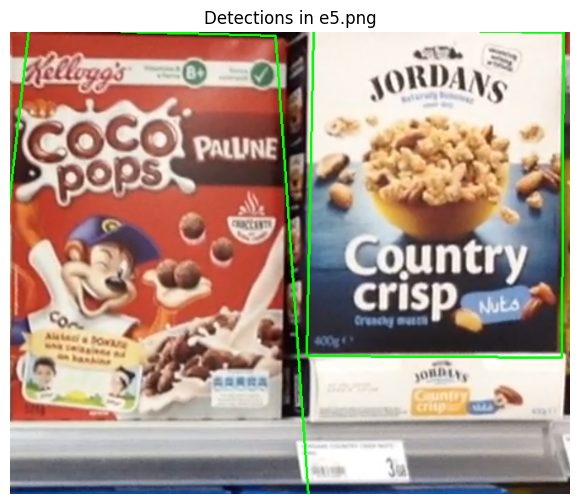

Product 19.jpg: inliers=238, center=(503.3,191.1), w=303.8px, h=389.1px
Product 25.jpg: inliers=42, center=(157.0,293.6), w=398.1px, h=596.3px


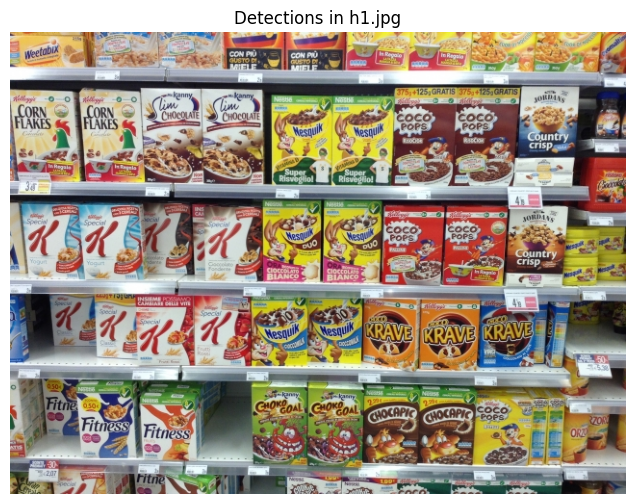

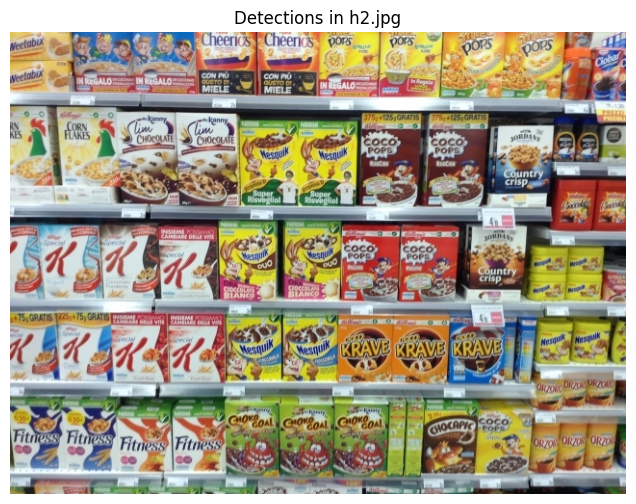

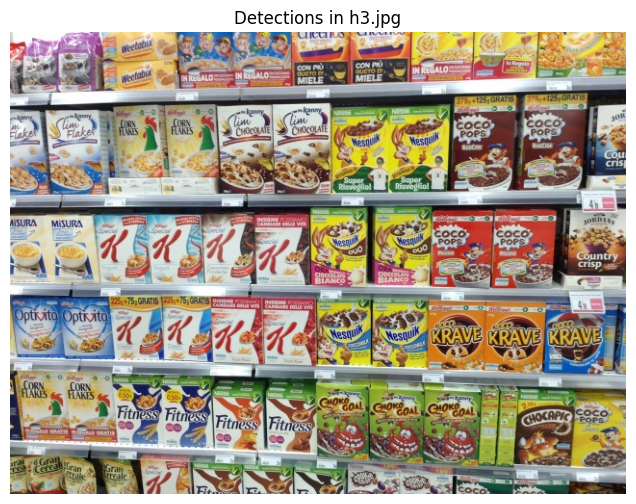

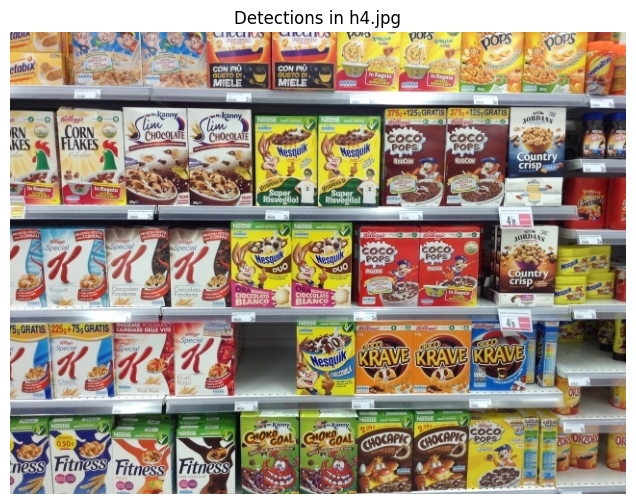

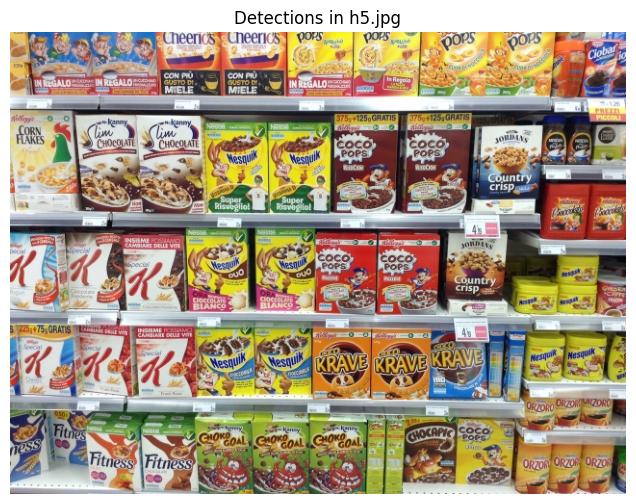

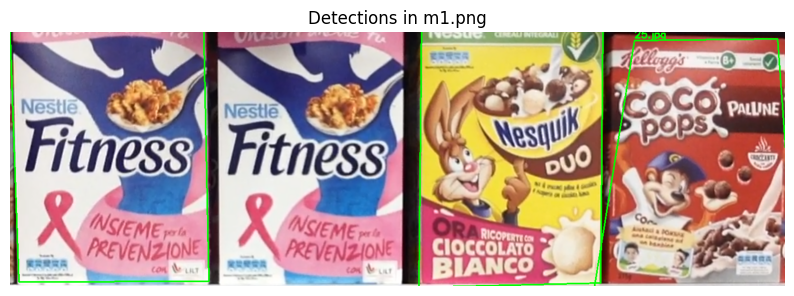

Product 24.jpg: inliers=44, center=(181.4,207.0), w=368.1px, h=505.0px
Product 25.jpg: inliers=47, center=(1255.5,316.3), w=397.9px, h=604.6px
Product 26.jpg: inliers=66, center=(920.5,221.1), w=337.5px, h=497.4px


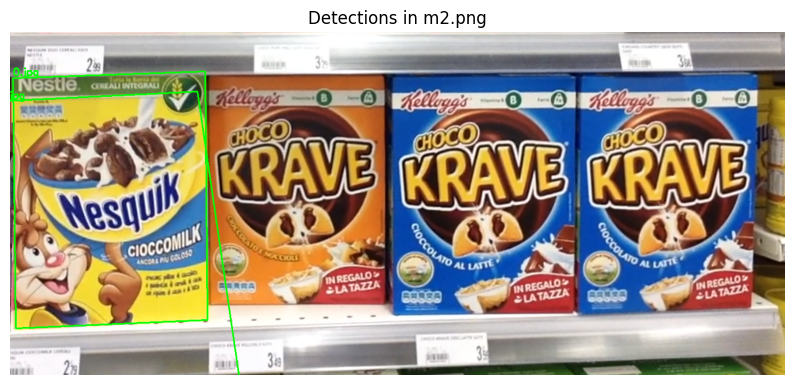

Product 0.jpg: inliers=27, center=(180.3,302.4), w=349.1px, h=460.7px
Product 26.jpg: inliers=29, center=(90.8,486.2), w=696.4px, h=755.5px


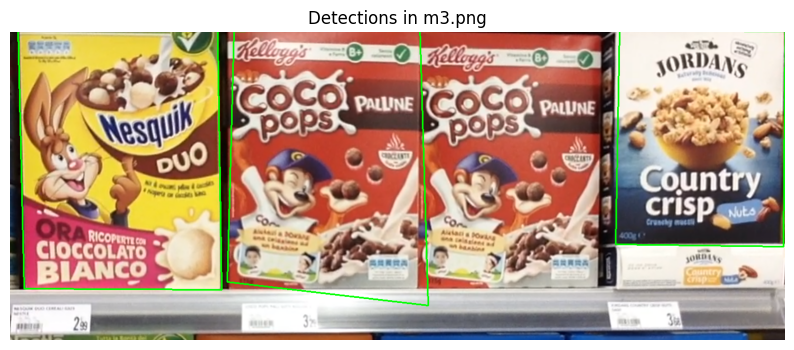

Product 19.jpg: inliers=197, center=(1233.8,190.9), w=303.1px, h=386.9px
Product 25.jpg: inliers=17, center=(568.1,240.7), w=359.0px, h=497.4px
Product 26.jpg: inliers=97, center=(196.3,208.0), w=365.2px, h=507.6px


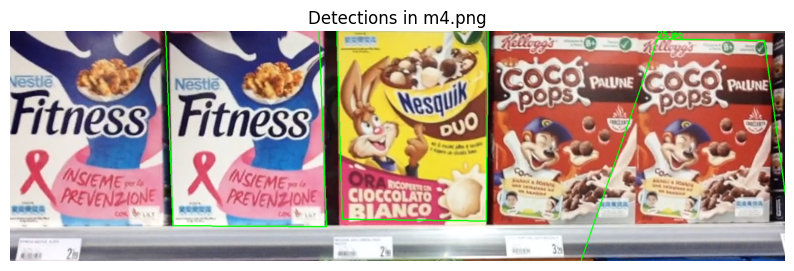

Product 24.jpg: inliers=49, center=(540.1,195.4), w=371.3px, h=503.3px
Product 25.jpg: inliers=27, center=(1541.0,358.6), w=560.9px, h=680.5px
Product 26.jpg: inliers=52, center=(921.6,190.9), w=349.3px, h=487.3px


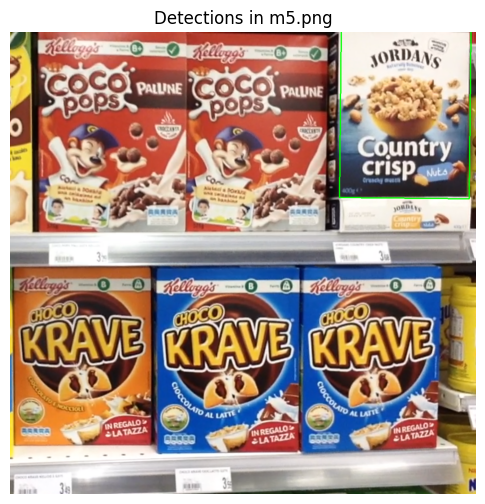

Product 19.jpg: inliers=123, center=(910.8,190.7), w=303.5px, h=386.7px


In [33]:
# 5. Run on all scenes
for scene_file in sorted(os.listdir(SCENE_DIR)):
    if not scene_file.lower().endswith(('.png','.jpg','.jpeg')):
        continue

    scene_path = os.path.join(SCENE_DIR, scene_file)
    scene = cv2.imread(scene_path)
    disp  = scene.copy()

    # store best detection per reference
    best = {}  # ref_file -> (inliers, center, (w,h), corners)

    for ref_file in REF_FILES:
        ref_img = cv2.imread(os.path.join(REF_DIR, ref_file))
        result = detect_instances(ref_img, scene)
        if result:
            center, dims, corners, inliers = result
            # keep only the detection with more inliers
            if ref_file not in best or inliers > best[ref_file][0]:
                best[ref_file] = (inliers, center, dims, corners)

    # draw bounding‐boxes for the best detections
    for ref_file, (inliers, center, (w_box, h_box), corners) in best.items():
        pts = corners.reshape(-1,1,2).astype(int)
        cv2.polylines(disp, [pts], True, (0,255,0), 2)
        # label at top‐left corner of box
        x0, y0 = pts[0][0]
        cv2.putText(disp, ref_file, (x0, y0-5),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0,255,0), 2)

    # show image
    plt.figure(figsize=(10,6))
    plt.title(f"Detections in {scene_file}")
    plt.axis('off')
    plt.imshow(cv2.cvtColor(disp, cv2.COLOR_BGR2RGB))
    plt.show()

    # print summary
    for ref_file, (inliers, center, dims, _) in best.items():
        cx, cy = center
        w_box, h_box = dims
        print(f"Product {ref_file}: inliers={inliers}, "
              f"center=({cx:.1f},{cy:.1f}), "
              f"w={w_box:.1f}px, h={h_box:.1f}px")
